# Cetacean embeddings — batch-effect correction comparison

Compares three correction strategies on the raw Perch V2 embeddings, then
visualises the result with PCA, t-SNE and UMAP — coloured by **dataset** and
by **class** side by side.

| # | Strategy | What it does | Inference-time? |
|---|----------|--------------|-----------------|
| 0 | **Raw** (baseline) | No correction | — |
| 1 | **Per-dataset standardisation** | Subtract dataset mean, divide by dataset std (per dim) | ✅ store μ/σ at fit time |
| 2 | **Harmony** | Iterative soft-cluster batch correction (class-conditional) | ⚠️ transductive — use as diagnostic |
| 3 | **ZCA whitening** | Per-dataset ZCA (full covariance) | ✅ store W at fit time |

The goal is to see how much dataset-driven clustering survives each correction,
and whether class signal is preserved or destroyed.


## 0. Imports & setup

In [1]:
import os, warnings, time, pickle
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from tqdm.auto import tqdm

from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

import umap
from openTSNE import TSNE as openTSNE
import harmonypy as hm

warnings.filterwarnings('ignore')
sns.set_style('whitegrid')
np.random.seed(42)

print("imports ok")


2026-06-29 18:53:54.185281: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-29 18:53:54.235774: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


imports ok


## 1. Paths — same as LODO notebook

In [2]:
IN_DIR  = Path('/data2/mromaniuc/cet-det/alltogether/full_corpus_together/mlp_runs')
PROJ_IN = Path('/data2/mromaniuc/cet-det/alltogether/full_exploration/dim_red/projector_input')
OUT_DIR = Path('./batch_correction_vis')
OUT_DIR.mkdir(exist_ok=True, parents=True)

META_PATH = IN_DIR  / 'meta_all_with_taxonomy.parquet'
X_PATH    = PROJ_IN / 'X_all.npy'

print(f"meta  exists={META_PATH.exists()}")
print(f"X_all exists={X_PATH.exists()}")


meta  exists=True
X_all exists=True


## 2. Load data & build joint label

Identical taxonomy logic to the LODO notebook.

In [3]:
meta_all = pd.read_parquet(META_PATH)
X_all    = np.load(X_PATH, mmap_mode='r')
print(f"meta_all : {len(meta_all):,} rows")
print(f"X_all    : {X_all.shape}  dtype={X_all.dtype}")


meta_all : 247,630 rows
X_all    : (247630, 1536)  dtype=float32


In [4]:
def build_joint_label(row):
    t4 = row['label_t4']
    if pd.notna(t4):
        return t4
    t1, t2 = row['label_t1'], row['label_t2']
    if pd.notna(t1) and t1 == 'non_mammal':
        return 'background'
    if pd.notna(t2) and t2 in ('background', 'anthropogenic'):
        return 'background'
    return None

meta = meta_all.copy()
meta['label_joint'] = meta.apply(build_joint_label, axis=1)
meta = meta.dropna(subset=['label_joint']).copy()
meta = meta.reset_index(drop=True)

print(f"labelled rows : {len(meta):,}")
print(f"classes       : {meta['label_joint'].nunique()}")
print(f"datasets      : {meta['dataset'].nunique()}")
print()
print(meta['label_joint'].value_counts().head(20).to_string())


labelled rows : 247,214
classes       : 11
datasets      : 12

label_joint
background                    213606
Orcinus_orca                   21809
Tursiops_truncatus              7250
Delphinus_delphis               1292
Physeter_macrocephalus          1089
Globicephala_melas               721
Balaenoptera_physalus            539
Delphinidae_unknown              508
Grampus_griseus                  239
Stenella_coeruleoalba            144
Balaenoptera_acutorostrata        17


## 3. PCA-50 on full corpus + subsample

Replicates `build_projections.py` exactly:

1. Fit **PCA-50 on all labelled rows** — same axes as your existing projector.
2. Build a **stratified subsample** (by `label_t2`, same as the script) for
   t-SNE and visualisation.
3. All corrections and downstream projections operate on these PCA-50
   coordinates, so the baseline is directly comparable to what you already have.


In [5]:
# ── tuneable (match build_projections.py defaults) ────────────────────────────
TSNE_SUBSAMPLE       = 50_000
PCA_INTERMEDIATE_DIM = 50
TSNE_PERPLEXITY      = 30
UMAP_N_NEIGHBORS     = 30
UMAP_MIN_DIST        = 0.1
RANDOM_SEED          = 42
# ──────────────────────────────────────────────────────────────────────────────

# 1. Load full embedding matrix aligned to meta
print("Loading full embedding matrix...")
X_full = np.ascontiguousarray(X_all[meta['row'].values], dtype=np.float32)
print(f"  X_full : {X_full.shape}")

# 2. PCA-50 on the full corpus — same as build_projections.py
print(f"\nFitting PCA-{PCA_INTERMEDIATE_DIM} on full corpus ({len(X_full):,} rows)...")
t0 = time.time()
pca_model = PCA(n_components=PCA_INTERMEDIATE_DIM, random_state=RANDOM_SEED)
X_pca50   = pca_model.fit_transform(X_full).astype(np.float32)
var = pca_model.explained_variance_ratio_
print(f"  done in {time.time()-t0:.1f}s")
print(f"  PC1={var[0]:.3f}  PC2={var[1]:.3f}  PC3={var[2]:.3f}  "
      f"PC1-3={var[:3].sum():.3f}  PC1-50={var.sum():.3f}")

# 3. Stratified subsample — stratify on label_t2 (same as build_projections.py)
print(f"\nBuilding stratified subsample (n={TSNE_SUBSAMPLE:,}, stratify on label_t2)...")
strat_labels = meta['label_t2'].fillna('__none__').to_numpy()
n_classes    = len(np.unique(strat_labels))
per_class    = max(1, TSNE_SUBSAMPLE // n_classes)

rng = np.random.default_rng(RANDOM_SEED)
sub_idx_parts = []
for cls in np.unique(strat_labels):
    idx_cls = np.where(strat_labels == cls)[0]
    n_pick  = min(per_class, len(idx_cls))
    chosen  = rng.choice(idx_cls, size=n_pick, replace=False)
    sub_idx_parts.append(chosen)

sub_idx = np.sort(np.concatenate(sub_idx_parts))
if len(sub_idx) > TSNE_SUBSAMPLE:
    sub_idx = np.sort(rng.choice(sub_idx, size=TSNE_SUBSAMPLE, replace=False))

print(f"  subsample size : {len(sub_idx):,}")

meta_sub   = meta.iloc[sub_idx].reset_index(drop=True)
X_sub_pca  = X_pca50[sub_idx].copy()    # PCA-50 coords of the subsample
X_sub_raw  = X_full[sub_idx].copy()     # raw 1536-d coords (for ZCA/std fitting)

print(f"  meta_sub  : {meta_sub.shape}")
print(f"  X_sub_pca : {X_sub_pca.shape}")
print(f"  datasets  : {meta_sub['dataset'].nunique()}")
print(f"  classes   : {meta_sub['label_joint'].nunique()}")


Loading full embedding matrix...


  X_full : (247214, 1536)

Fitting PCA-50 on full corpus (247,214 rows)...
  done in 6.0s
  PC1=0.090  PC2=0.053  PC3=0.039  PC1-3=0.181  PC1-50=0.643

Building stratified subsample (n=50,000, stratify on label_t2)...
  subsample size : 38,056
  meta_sub  : (38056, 65)
  X_sub_pca : (38056, 50)
  datasets  : 12
  classes   : 11


## 4. Colour palettes

Fixed colour maps so every panel uses the same colours for the same label.

In [6]:
datasets = sorted(meta_sub['dataset'].unique())
classes  = sorted(meta_sub['label_joint'].unique())

# Use tab20 + tab20b for datasets (up to ~28 distinct colours)
ds_cmap   = plt.cm.get_cmap('tab20', len(datasets))
ds_colors = {ds: ds_cmap(i) for i, ds in enumerate(datasets)}

# Use a perceptually-distinct palette for classes
cls_cmap   = plt.cm.get_cmap('tab20b', len(classes))
cls_colors = {c: cls_cmap(i) for i, c in enumerate(classes)}

def make_legend(color_dict, ax, title, ncol=1, fontsize=7):
    patches = [mpatches.Patch(color=v, label=k) for k, v in color_dict.items()]
    ax.legend(handles=patches, title=title, loc='upper right',
              fontsize=fontsize, title_fontsize=fontsize+1,
              ncol=ncol, framealpha=0.7)

print(f"datasets : {len(datasets)}")
print(f"classes  : {len(classes)}")


datasets : 12
classes  : 11


## 5. Projection helpers

In [7]:
def run_pca2(X_pca50):
    """Take first 2 PCs of already-reduced PCA-50 matrix — same as build_projections.py."""    
    return X_pca50[:, :2].copy()


def run_umap(X_pca50, n_neighbors=UMAP_N_NEIGHBORS, min_dist=UMAP_MIN_DIST):
    """UMAP on PCA-50 input — tries cuML, falls back to umap-learn (no random_state
    to keep all cores busy, matching build_projections.py behaviour)."""    
    t0 = time.time()
    try:
        from cuml.manifold import UMAP as cuUMAP
        print("  UMAP via cuML...", end=' ', flush=True)
        Y = cuUMAP(n_components=2, n_neighbors=n_neighbors,
                   min_dist=min_dist, random_state=RANDOM_SEED).fit_transform(X_pca50)
        Y = np.asarray(Y, dtype=np.float32)
    except Exception:
        print("  UMAP via umap-learn (no random_state → all cores)...", end=' ', flush=True)
        Y = umap.UMAP(n_components=2, n_neighbors=n_neighbors,
                      min_dist=min_dist, low_memory=True,
                      verbose=False).fit_transform(X_pca50).astype(np.float32)
    print(f"done in {time.time()-t0:.1f}s")
    return Y


def run_tsne(X_pca50, perplexity=TSNE_PERPLEXITY):
    """openTSNE FFT on PCA-50 input — matches build_projections.py exactly."""    
    t0 = time.time()
    print("  t-SNE via openTSNE (fft)...", end=' ', flush=True)
    Y = openTSNE(
        n_components=2,
        perplexity=perplexity,
        n_jobs=-1,
        random_state=RANDOM_SEED,
        negative_gradient_method='fft',
        verbose=False,
    ).fit(X_pca50)
    Y = np.asarray(Y, dtype=np.float32)
    print(f"done in {time.time()-t0:.1f}s")
    return Y


def plot_projections(embeddings_dict, meta_df, ds_colors, cls_colors,
                     title_prefix='', dot_size=4, alpha=0.6, save_path=None):
    """
    embeddings_dict : {'PCA': arr, 't-SNE': arr, 'UMAP': arr}
    2-row × 3-col figure: top = coloured by dataset, bottom = coloured by class.
    """
    proj_names = list(embeddings_dict.keys())
    n_proj = len(proj_names)
    fig, axes = plt.subplots(2, n_proj, figsize=(6*n_proj, 10))

    ds_vals  = meta_df['dataset'].values
    cls_vals = meta_df['label_joint'].values

    for col, pname in enumerate(proj_names):
        emb = embeddings_dict[pname]

        for row_i, (color_dict, key, row_title) in enumerate([
            (ds_colors,  ds_vals,  'by dataset'),
            (cls_colors, cls_vals, 'by class'),
        ]):
            ax = axes[row_i, col]
            colors = [color_dict[v] for v in key]
            ax.scatter(emb[:, 0], emb[:, 1], c=colors,
                       s=dot_size, alpha=alpha, linewidths=0)
            ax.set_title(f'{title_prefix}  {pname}\n{row_title}', fontsize=10)
            ax.set_xticks([]); ax.set_yticks([])
            if col == n_proj - 1:
                ax.legend(
                    handles=[mpatches.Patch(color=v, label=k)
                              for k, v in color_dict.items()],
                    title=key if isinstance(key, str) else ('dataset' if row_i==0 else 'class'),
                    fontsize=6, title_fontsize=7,
                    loc='upper right', ncol=1, framealpha=0.7,
                )

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"saved → {save_path}")
    plt.show()


## 6. Correction functions

In [8]:
# ── Strategy 1: per-dataset standardisation ───────────────────────────────────

def fit_dataset_standardisation(X, meta):
    """
    Fit per-dataset (mean, std) on X.
    Returns a dict  {dataset_name: {'mean': ..., 'std': ...}}
    that can be stored and reused at inference time.
    """
    stats = {}
    for ds, grp in meta.groupby('dataset'):
        rows  = grp.index.values           # positions in X (already aligned)
        X_ds  = X[rows]
        mu    = X_ds.mean(axis=0)
        sigma = X_ds.std(axis=0).clip(min=1e-6)
        stats[ds] = {'mean': mu, 'std': sigma}
    return stats


def apply_dataset_standardisation(X, meta, stats):
    """
    Apply stored per-dataset stats to X.
    Unknown datasets fall back to the identity transform (no correction).
    """
    X_out = X.copy()
    for ds, grp in meta.groupby('dataset'):
        rows = grp.index.values
        if ds in stats:
            X_out[rows] = (X[rows] - stats[ds]['mean']) / stats[ds]['std']
        else:
            print(f"  [warn] dataset '{ds}' not in stats — no correction applied")
    return X_out


In [9]:
# ── Strategy 2: Harmony ───────────────────────────────────────────────────────

def apply_harmony(X, meta, pca_components=50):
    """
    Run Harmony on a PCA-reduced version of X.

    Harmony operates in PCA space (standard practice from the single-cell
    literature). We:
      1. Reduce to `pca_components` with PCA.
      2. Run Harmony with dataset as the batch variable and label_joint as
         the covariate to preserve.
      3. Return the corrected PCA coordinates (same shape as the PCA input).

    Note: the output dimensionality is `pca_components`, not 1536. That is
    intentional — the visualisation will project from corrected PCA space.
    If you want corrected full-dim embeddings you would need to invert the PCA
    (approximate reconstruction), which is lossy and not recommended.
    """
    t0 = time.time()
    n_pre = min(pca_components, X.shape[1], X.shape[0]-1)
    pca   = PCA(n_components=n_pre, random_state=42)
    Z     = pca.fit_transform(X)           # (n, pca_components)

    # harmonypy expects (n_cells × n_pcs) — our Z is already that shape
    # meta_data must be a DataFrame with the batch column
    meta_hm = meta[['dataset', 'label_joint']].copy()

    ho = hm.run_harmony(
        Z,
        meta_hm,
        vars_use=['dataset'],              # batch variable
        vars_use_text=['label_joint'],     # covariate to preserve (if supported)
        random_state=42,
        verbose=False,
    )

    Z_corrected = ho.Z_corr.T             # harmonypy returns (pca_components × n)
    print(f"  Harmony done in {time.time()-t0:.1f}s")
    return Z_corrected, pca


In [10]:
# ── Strategy 3: ZCA whitening per dataset ─────────────────────────────────────

def fit_zca_whitening(X, meta, eps=1e-5):
    """
    Fit per-dataset ZCA whitening matrices.
    Returns a dict {dataset_name: {'mean': ..., 'W': ...}}
    where W is the (d × d) ZCA matrix.

    ZCA is more expensive than std normalisation (eigendecomposition per
    dataset) but removes cross-dimensional correlations, not just variance.
    For 1536-dim embeddings this is ~100 ms per dataset on CPU — fine.
    """
    stats = {}
    for ds, grp in tqdm(meta.groupby('dataset'), desc='fit ZCA'):
        rows  = grp.index.values
        X_ds  = X[rows].astype(np.float64)
        mu    = X_ds.mean(axis=0)
        X_c   = X_ds - mu
        cov   = np.cov(X_c, rowvar=False)            # (d × d)
        U, S, _ = np.linalg.svd(cov)
        W     = U @ np.diag(1.0 / np.sqrt(S + eps)) @ U.T
        stats[ds] = {'mean': mu.astype(np.float32),
                     'W':    W.astype(np.float32)}
    return stats


def apply_zca_whitening(X, meta, stats):
    """Apply stored per-dataset ZCA matrices."""
    X_out = X.copy().astype(np.float32)
    for ds, grp in meta.groupby('dataset'):
        rows = grp.index.values
        if ds in stats:
            X_c          = X[rows] - stats[ds]['mean']
            X_out[rows]  = X_c @ stats[ds]['W'].T
        else:
            print(f"  [warn] dataset '{ds}' not in stats — no correction applied")
    return X_out


# ── Strategy 4: class-conditional linear OT on top of ZCA ────────────────────
#
#  Pipeline:
#    X_raw  →  ZCA (per dataset)  →  X_zca  →  OT (per dataset×class)  →  X_zca_ot
#
#  Why ZCA first?
#    ZCA removes first- and second-order dataset-specific statistics (mean
#    shift + scale/correlation). OT then only needs to handle the residual
#    higher-order distributional differences, which makes the OT problem
#    smaller and better-conditioned.
#
#  Why class-conditional OT and not plain OT?
#    With nearly mono-class datasets (FREMANTLE=Tursiops, DOLPHINFREE=Physeter,
#    etc.) a global OT map would still align the wrong distributions.
#    Conditioning on class ensures Tursiops→Tursiops, sperm whale→sperm whale.
#
#  Reference dataset:
#    Watkins is used as the alignment target — it is the most class-diverse
#    source in the corpus (10+ species). All other datasets are mapped toward
#    its class-conditional distributions.
#    Change REFERENCE_DATASET if you want a different anchor.
REFERENCE_DATASET = None   # not used in synthetic-reference mode

def fit_ot_synthetic_reference(X_zca, meta, label_col='label_joint',
                                min_samples_per_ds=10, eps=1e-6):
    """
    Fit per-(dataset, class) linear OT maps toward a synthetic reference.

    The synthetic reference for each class is the pooled mean and covariance
    across ALL datasets for that class. This avoids needing a single
    reference dataset and is robust when no dataset has all classes.

    Rows whose class appears in only one dataset are left uncorrected
    (singleton-class problem — no cross-dataset signal exists).
    """
    ot_stats = {}
    skipped  = []

    # pre-compute synthetic reference stats per class
    print("  computing synthetic (pooled) reference per class...")
    ref_stats = {}
    for cls, grp in meta.groupby(label_col):
        idx = grp.index.values
        if len(idx) < 2:
            continue
        X_cls      = X_zca[idx].astype(np.float64)
        mu         = X_cls.mean(axis=0)
        d          = X_cls.shape[1]
        cov        = (np.cov((X_cls - mu).T) + eps * np.eye(d)
                      if len(idx) >= d + 2 else None)
        ref_stats[cls] = {'mu': mu, 'cov': cov, 'n': len(idx)}

    # fit per-(dataset, class) map toward the synthetic reference
    for ds, grp in tqdm(meta.groupby('dataset'), desc='fit OT (synthetic ref)'):
        ds_classes = meta.loc[grp.index, label_col].unique()

        for cls in ds_classes:
            src_idx = meta.index[
                (meta['dataset'] == ds) & (meta[label_col] == cls)
            ].values

            if len(src_idx) < min_samples_per_ds:
                skipped.append((ds, cls, 'too few source samples'))
                continue

            if cls not in ref_stats:
                skipped.append((ds, cls, 'class absent globally'))
                continue

            ref = ref_stats[cls]

            # check if this dataset IS the only contributor to the reference
            # i.e. singleton class — can't align to yourself
            n_datasets_with_cls = meta[meta[label_col] == cls]['dataset'].nunique()
            if n_datasets_with_cls == 1:
                skipped.append((ds, cls, 'singleton class'))
                continue

            X_src  = X_zca[src_idx].astype(np.float64)
            mu_src = X_src.mean(axis=0)
            mu_tgt = ref['mu']
            d      = X_src.shape[1]

            if ref['cov'] is None or len(src_idx) < d + 2:
                # translation only — not enough samples for covariance
                A = np.eye(d, dtype=np.float32)
            else:
                Sigma_src = np.cov((X_src - mu_src).T) + eps * np.eye(d)
                S_src_sqrt     = _matrix_sqrt(Sigma_src, eps)
                S_src_sqrt_inv = _matrix_sqrt_inv(Sigma_src, eps)
                M   = S_src_sqrt @ ref['cov'] @ S_src_sqrt
                M12 = _matrix_sqrt(M, eps)
                A   = (S_src_sqrt_inv @ M12 @ S_src_sqrt_inv).astype(np.float32)

            ot_stats[(ds, cls)] = {
                'A':      A,
                'mu_src': mu_src.astype(np.float32),
                'mu_tgt': mu_tgt.astype(np.float32),
            }

    if skipped:
        print(f"\n  [OT] {len(skipped)} pairs skipped:")
        for ds, cls, reason in skipped:
            print(f"       {ds}  /  {cls}  ({reason})")

    print(f"\n  [OT] {len(ot_stats)} maps fitted across "
          f"{meta['dataset'].nunique()} datasets")
    return ot_stats, skipped


def apply_ot_on_zca(X_zca, meta, ot_stats, label_col='label_joint'):
    """Apply stored OT maps — works for both reference-based and synthetic."""
    X_out       = X_zca.copy().astype(np.float32)
    n_corrected = 0
    n_skipped   = 0

    for ds, grp in tqdm(meta.groupby('dataset'), desc='apply OT'):
        for cls, sub in grp.groupby(label_col):
            rows = sub.index.values
            key  = (ds, cls)
            if key not in ot_stats:
                n_skipped += len(rows)
                continue
            s           = ot_stats[key]
            X_c         = X_zca[rows].astype(np.float32) - s['mu_src']
            X_out[rows] = X_c @ s['A'].T + s['mu_tgt']
            n_corrected += len(rows)

    print(f"\n  [OT] corrected {n_corrected:,} rows  |  "
          f"left unchanged {n_skipped:,} rows")
    return X_out

## 7. Apply corrections

Correction statistics are fit on **all** labelled data (full `meta` / `X_all`),
then the corrected subsample is extracted for visualisation. This is the correct
order — fitting on the subsample would give different statistics.


In [11]:
print("Fitting correction statistics on full corpus (X_full aligned to meta)...")

# ── 1. per-dataset standardisation ───────────────────────────────────────────
print("\n[1/3] per-dataset standardisation...")
t0 = time.time()
std_stats = {}
for ds, grp in meta.groupby('dataset'):
    rows  = grp.index.values
    X_ds  = X_full[rows]
    mu    = X_ds.mean(axis=0)
    sigma = X_ds.std(axis=0).clip(min=1e-6)
    std_stats[ds] = {'mean': mu, 'std': sigma}
print(f"  done in {time.time()-t0:.1f}s  ({len(std_stats)} datasets)")

# ── 2. ZCA per dataset ────────────────────────────────────────────────────────
print("\n[2/3] ZCA whitening per dataset...")
t0 = time.time()
zca_stats = {}
for ds, grp in tqdm(meta.groupby('dataset'), desc='fit ZCA'):
    rows  = grp.index.values
    X_ds  = X_full[rows].astype(np.float64)
    mu    = X_ds.mean(axis=0)
    X_c   = X_ds - mu
    cov   = np.cov(X_c, rowvar=False)
    U, S, _ = np.linalg.svd(cov)
    W     = U @ np.diag(1.0 / np.sqrt(S + 1e-5)) @ U.T
    zca_stats[ds] = {'mean': mu.astype(np.float32), 'W': W.astype(np.float32)}
print(f"  done in {time.time()-t0:.1f}s")


print("\n[3/3] class-conditional linear OT (synthetic reference)...")
t0 = time.time()


def _matrix_sqrt(M, eps=1e-6):
    """Symmetric PSD matrix square root via eigendecomposition."""
    M = (M + M.T) / 2.0                      # enforce symmetry (kills float drift)
    w, V = np.linalg.eigh(M)                 # eigh: symmetric, real eigenvalues
    w = np.clip(w, eps, None)                # floor tiny/negative eigenvalues
    return (V * np.sqrt(w)) @ V.T

def _matrix_sqrt_inv(M, eps=1e-6):
    """Symmetric inverse matrix square root via eigendecomposition."""
    M = (M + M.T) / 2.0
    w, V = np.linalg.eigh(M)
    w = np.clip(w, eps, None)
    return (V * (1.0 / np.sqrt(w))) @ V.T


X_zca_for_ot = X_full.copy().astype(np.float32)
for ds, grp in meta.groupby('dataset'):
    rows = grp.index.values
    if ds in zca_stats:
        X_c = X_full[rows] - zca_stats[ds]['mean']
        X_zca_for_ot[rows] = X_c @ zca_stats[ds]['W'].T

ot_stats, ot_skipped = fit_ot_synthetic_reference(
    X_zca_for_ot, meta, label_col='label_joint'
)
del X_zca_for_ot
print(f"  done in {time.time()-t0:.1f}s")

# Harmony is fit on-the-fly below (transductive by design).
print("\nAll fit stats ready.")

Fitting correction statistics on full corpus (X_full aligned to meta)...

[1/3] per-dataset standardisation...
  done in 1.9s  (12 datasets)

[2/3] ZCA whitening per dataset...


fit ZCA:   0%|          | 0/12 [00:00<?, ?it/s]

  done in 20.1s

[3/3] class-conditional linear OT (synthetic reference)...
  computing synthetic (pooled) reference per class...


fit OT (synthetic ref):   0%|          | 0/12 [00:00<?, ?it/s]


  [OT] 1 pairs skipped:
       WATKINS  /  Balaenoptera_acutorostrata  (singleton class)

  [OT] 44 maps fitted across 12 datasets
  done in 37.2s

All fit stats ready.


In [12]:
# ════════════════════════════════════════════════════════════════════════════
#  CELL 1 — Apply corrections + PCA-50
# ════════════════════════════════════════════════════════════════════════════
 
print("Applying corrections to full corpus, then projecting to PCA-50 space...")
 
# ── std normalisation ─────────────────────────────────────────────────────────
X_std_full = X_full.copy()
for ds, grp in meta.groupby('dataset'):
    rows = grp.index.values
    X_std_full[rows] = (X_full[rows] - std_stats[ds]['mean']) / std_stats[ds]['std']
 
# ── ZCA ───────────────────────────────────────────────────────────────────────
X_zca_full = X_full.copy().astype(np.float32)
for ds, grp in tqdm(meta.groupby('dataset'), desc='apply ZCA'):
    rows = grp.index.values
    X_c  = X_full[rows] - zca_stats[ds]['mean']
    X_zca_full[rows] = X_c @ zca_stats[ds]['W'].T
 
# ── ZCA + OT ──────────────────────────────────────────────────────────────────
# OT maps were fitted on ZCA-whitened embeddings in the fitting cell.
# apply_ot_on_zca() takes X_zca_full as input and returns the further-corrected
# embeddings. X_zca_full is NOT modified in place — X_zcaot_full is a new array.
print("\nApplying OT alignment on top of ZCA...")
t0 = time.time()
X_zcaot_full = apply_ot_on_zca(X_zca_full, meta, ot_stats, label_col='label_joint')
print(f"  ZCA+OT done in {time.time()-t0:.1f}s")
 
# ── PCA-50 on each corrected full-corpus matrix ───────────────────────────────
print("\nFitting PCA-50 on corrected full-corpus embeddings...")
 
t0 = time.time()
pca_std = PCA(n_components=PCA_INTERMEDIATE_DIM, random_state=RANDOM_SEED)
X_std_pca50_full = pca_std.fit_transform(X_std_full.astype(np.float32))
print(f"  std    PCA-50 done in {time.time()-t0:.1f}s")
 
t0 = time.time()
pca_zca = PCA(n_components=PCA_INTERMEDIATE_DIM, random_state=RANDOM_SEED)
X_zca_pca50_full = pca_zca.fit_transform(X_zca_full)
print(f"  ZCA    PCA-50 done in {time.time()-t0:.1f}s")
 
t0 = time.time()
pca_zcaot = PCA(n_components=PCA_INTERMEDIATE_DIM, random_state=RANDOM_SEED)
X_zcaot_pca50_full = pca_zcaot.fit_transform(X_zcaot_full)
print(f"  ZCA+OT PCA-50 done in {time.time()-t0:.1f}s")
 
del X_std_full, X_zca_full, X_zcaot_full   # raw corrected embeddings no longer needed
 
# ── Subsample slices (for t-SNE and Harmony only) ────────────────────────────
X_raw_sub   = X_pca50[sub_idx].copy()
X_std_sub   = X_std_pca50_full[sub_idx].copy()
X_zca_sub   = X_zca_pca50_full[sub_idx].copy()
X_zcaot_sub = X_zcaot_pca50_full[sub_idx].copy()
 
print(f"\nFull-corpus PCA-50 shapes:")
print(f"  raw    : {X_pca50.shape}")
print(f"  std    : {X_std_pca50_full.shape}")
print(f"  zca    : {X_zca_pca50_full.shape}")
print(f"  zca+ot : {X_zcaot_pca50_full.shape}")
print(f"\nSubsample shapes (for t-SNE / Harmony):")
print(f"  raw    : {X_raw_sub.shape}")
print(f"  std    : {X_std_sub.shape}")
print(f"  zca    : {X_zca_sub.shape}")
print(f"  zca+ot : {X_zcaot_sub.shape}")
 

Applying corrections to full corpus, then projecting to PCA-50 space...


apply ZCA:   0%|          | 0/12 [00:00<?, ?it/s]


Applying OT alignment on top of ZCA...


apply OT:   0%|          | 0/12 [00:00<?, ?it/s]


  [OT] corrected 247,197 rows  |  left unchanged 17 rows
  ZCA+OT done in 5.8s

Fitting PCA-50 on corrected full-corpus embeddings...
  std    PCA-50 done in 6.4s
  ZCA    PCA-50 done in 5.9s
  ZCA+OT PCA-50 done in 5.9s

Full-corpus PCA-50 shapes:
  raw    : (247214, 50)
  std    : (247214, 50)
  zca    : (247214, 50)
  zca+ot : (247214, 50)

Subsample shapes (for t-SNE / Harmony):
  raw    : (38056, 50)
  std    : (38056, 50)
  zca    : (38056, 50)
  zca+ot : (38056, 50)


In [13]:
print("Running Harmony on subsample PCA-50 coordinates...")
t0 = time.time()

meta_hm = meta_sub[['dataset']].copy()

ho = hm.run_harmony(
    X_raw_sub,            
    meta_hm,
    vars_use=['dataset'],
    max_iter_harmony=20,
    verbose=False,
)

X_harmony_sub = ho.Z_corr.T.astype(np.float32)   # (n_sub, 50)
print(f"  Harmony done in {time.time()-t0:.1f}s  shape={X_harmony_sub.shape}")


Running Harmony on subsample PCA-50 coordinates...
  Harmony done in 3.2s  shape=(50, 38056)


## 8. Run projections for each corrected version

This is the slow step — t-SNE is O(n log n) but still takes a few minutes per variant.

In [14]:
# ── force correct Harmony orientation before projecting ──
if X_harmony_sub.shape[0] == PCA_INTERMEDIATE_DIM and X_harmony_sub.shape[1] != PCA_INTERMEDIATE_DIM:
    X_harmony_sub = X_harmony_sub.T
    print(f"  transposed Harmony to {X_harmony_sub.shape}")

assert X_harmony_sub.shape[0] == len(meta_sub), \
    f"Harmony shape mismatch: {X_harmony_sub.shape[0]} rows vs {len(meta_sub)} in meta_sub"

print(f"  Harmony shape confirmed: {X_harmony_sub.shape}")

  transposed Harmony to (38056, 50)
  Harmony shape confirmed: (38056, 50)


In [15]:

# PCA and UMAP  →  full corpus
# t-SNE         →  stratified subsample only (50k cap)
# Harmony       →  subsample only (transductive by design)
# ZCA+OT        →  full corpus (not transductive)
 
variants_full = {
    'Raw (baseline)':    X_pca50,
    'Std normalisation': X_std_pca50_full,
    'ZCA whitening':     X_zca_pca50_full,
    'ZCA + OT':          X_zcaot_pca50_full,
}
variants_sub = {
    'Raw (baseline)':    X_raw_sub,
    'Std normalisation': X_std_sub,
    'ZCA whitening':     X_zca_sub,
    'ZCA + OT':          X_zcaot_sub,
    'Harmony':           X_harmony_sub,
}
 
projections = {}   # {name: {'PCA': (n,2), 'UMAP': (n,2), 't-SNE': (n_sub,2)}}
# note: PCA and UMAP have n=len(meta) rows; t-SNE has len(sub_idx) rows
# meta_sub is used for t-SNE / Harmony plots; meta for PCA / UMAP plots
 
for name in ['Raw (baseline)', 'Std normalisation', 'ZCA whitening', 'ZCA + OT']:
    X_f = variants_full[name]
    X_s = variants_sub[name]
    print(f"\n{'─'*60}")
    print(f"  {name}")
    print(f"  full={X_f.shape}  sub={X_s.shape}")
    print(f"{'─'*60}")
    proj = {}
 
    print("  PCA  (full corpus)...")
    proj['PCA']   = run_pca2(X_f)          # (n_full, 2)
 
    print("  UMAP (full corpus)...")
    proj['UMAP']  = run_umap(X_f)          # (n_full, 2)
 
    print("  t-SNE (subsample)...")
    proj['t-SNE'] = run_tsne(X_s)          # (n_sub,  2)
 
    projections[name] = proj
 
# Harmony — all three projections on subsample (no full-corpus version)
print(f"\n{'─'*60}")
print(f"  Harmony  (subsample only, transductive)")
print(f"  sub={X_harmony_sub.shape}")
print(f"{'─'*60}")
proj = {}
print("  PCA  (subsample)...")
proj['PCA']   = run_pca2(X_harmony_sub)
print("  UMAP (subsample)...")
proj['UMAP']  = run_umap(X_harmony_sub)
print("  t-SNE (subsample)...")
proj['t-SNE'] = run_tsne(X_harmony_sub)
projections['Harmony'] = proj
 
print("\nAll projections complete.")


────────────────────────────────────────────────────────────
  Raw (baseline)
  full=(247214, 50)  sub=(38056, 50)
────────────────────────────────────────────────────────────
  PCA  (full corpus)...
  UMAP (full corpus)...
  UMAP via umap-learn (no random_state → all cores)... 

done in 112.2s
  t-SNE (subsample)...
  t-SNE via openTSNE (fft)... done in 95.6s

────────────────────────────────────────────────────────────
  Std normalisation
  full=(247214, 50)  sub=(38056, 50)
────────────────────────────────────────────────────────────
  PCA  (full corpus)...
  UMAP (full corpus)...
  UMAP via umap-learn (no random_state → all cores)... done in 159.4s
  t-SNE (subsample)...
  t-SNE via openTSNE (fft)... done in 94.2s

────────────────────────────────────────────────────────────
  ZCA whitening
  full=(247214, 50)  sub=(38056, 50)
────────────────────────────────────────────────────────────
  PCA  (full corpus)...
  UMAP (full corpus)...
  UMAP via umap-learn (no random_state → all cores)... done in 79.8s
  t-SNE (subsample)...
  t-SNE via openTSNE (fft)... done in 42.7s

────────────────────────────────────────────────────────────
  ZCA + OT
  full=(247214, 50)  sub=(38056, 50)
────────────────────────────────────────────────────────────
  PCA  (full corpus)..

## 9. Visualise

One 2×3 figure per variant (rows = coloured by dataset / by class; cols = PCA / t-SNE / UMAP).

saved → batch_correction_vis/batch_correction_raw_baseline_pca.png


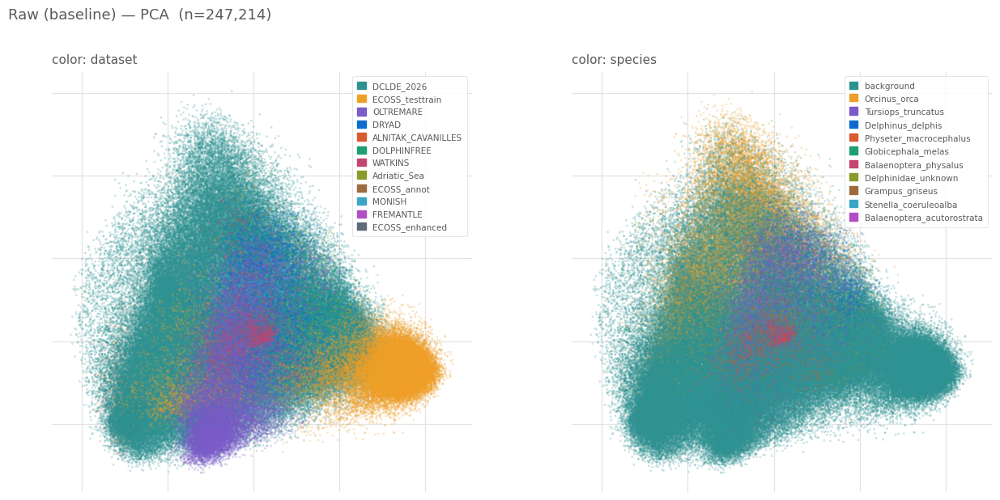

saved → batch_correction_vis/batch_correction_raw_baseline_umap.png


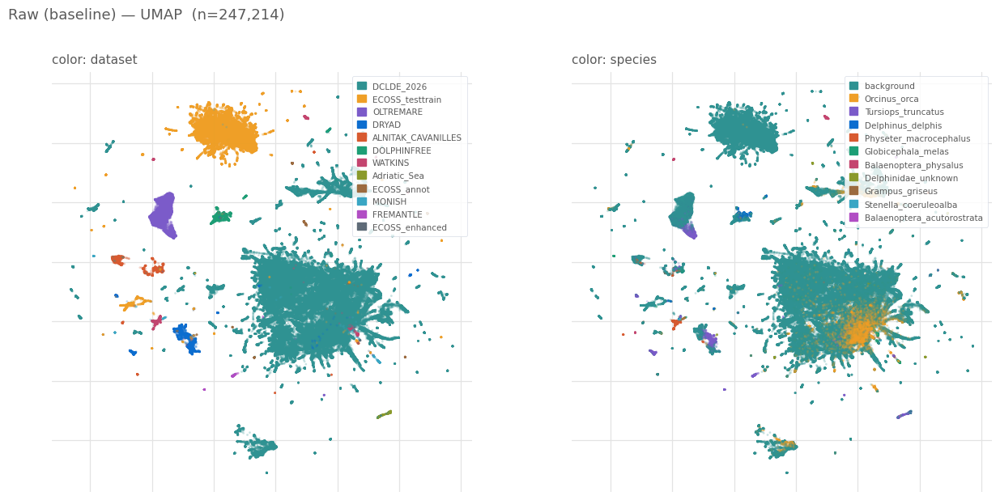

saved → batch_correction_vis/batch_correction_raw_baseline_tsne.png


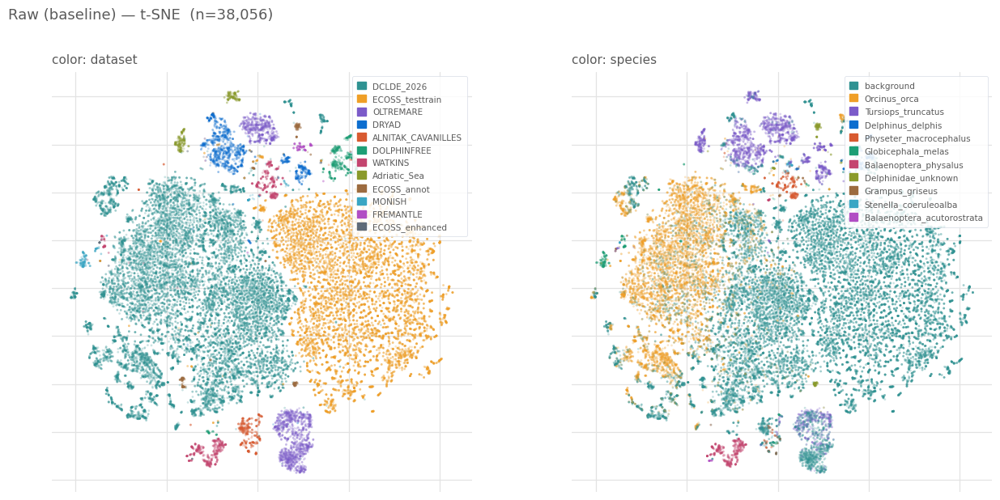

saved → batch_correction_vis/batch_correction_std_normalisation_pca.png


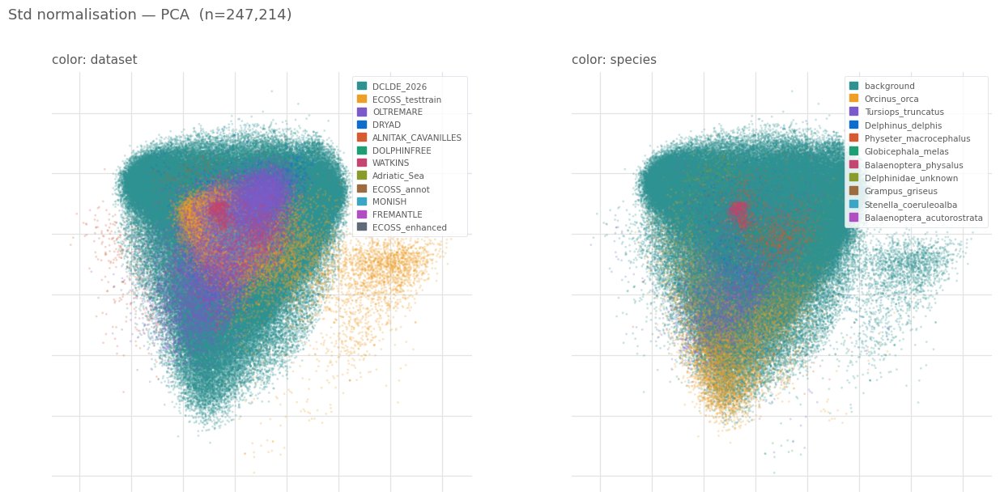

saved → batch_correction_vis/batch_correction_std_normalisation_umap.png


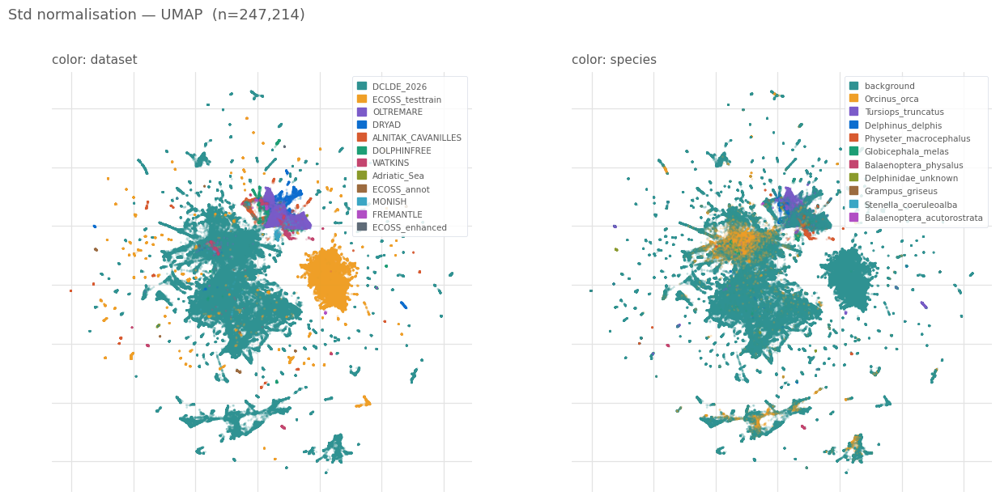

saved → batch_correction_vis/batch_correction_std_normalisation_tsne.png


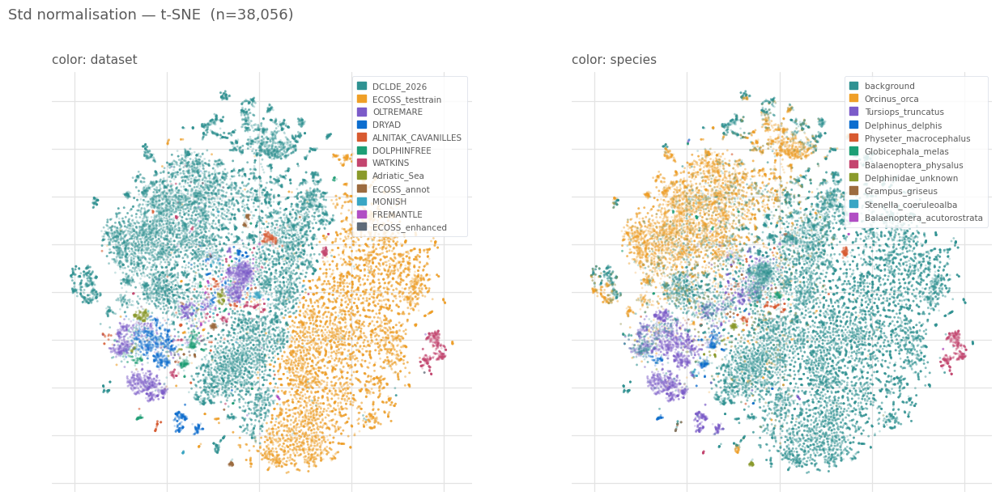

saved → batch_correction_vis/batch_correction_zca_whitening_pca.png


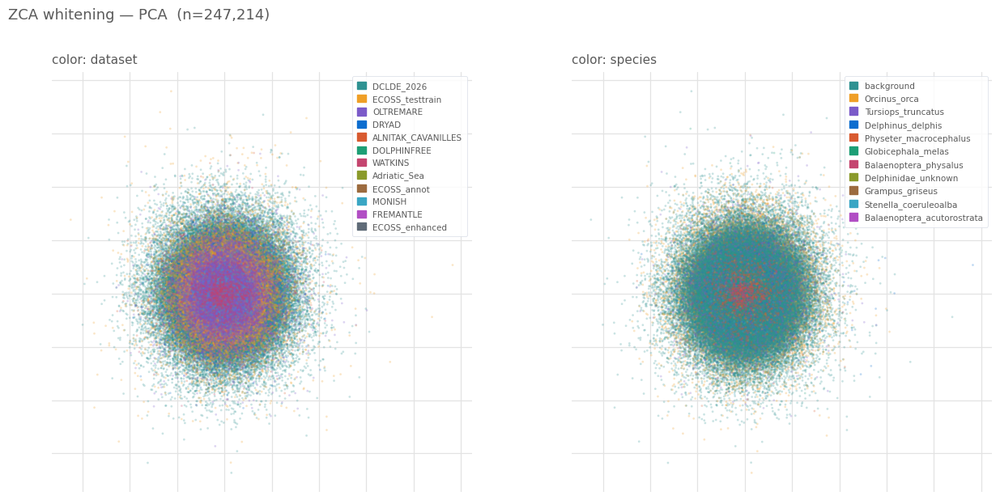

saved → batch_correction_vis/batch_correction_zca_whitening_umap.png


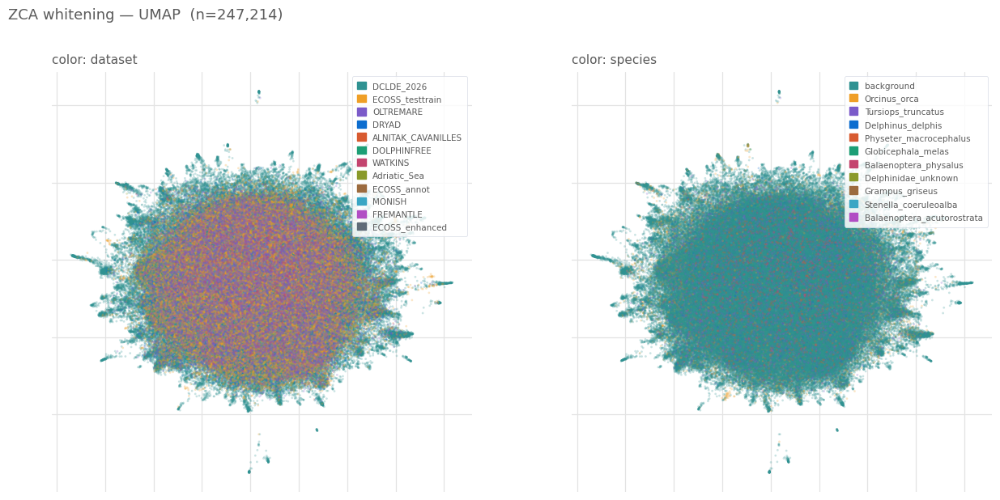

saved → batch_correction_vis/batch_correction_zca_whitening_tsne.png


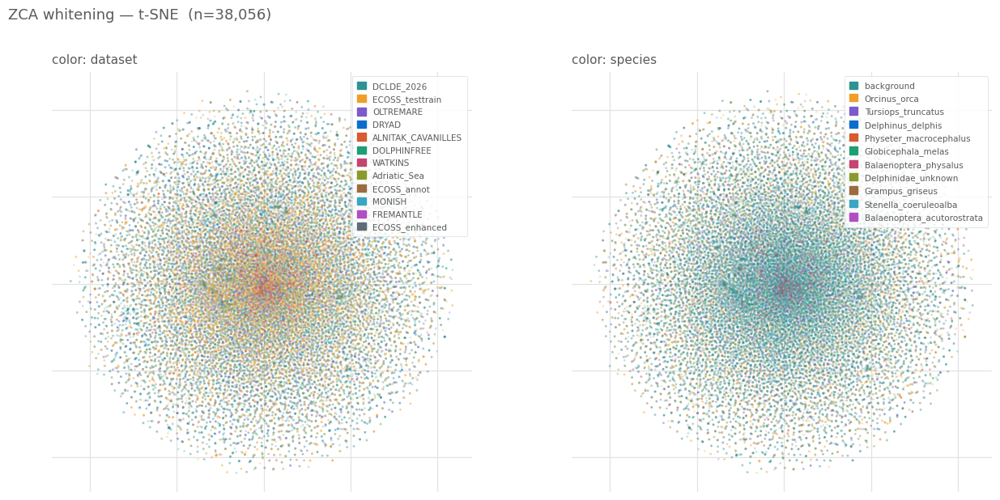

saved → batch_correction_vis/batch_correction_zca_+_ot_pca.png


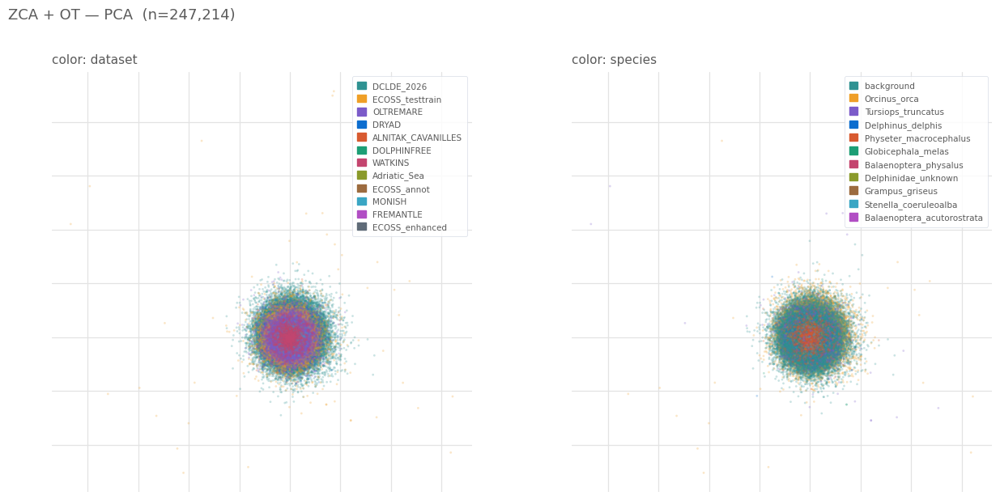

saved → batch_correction_vis/batch_correction_zca_+_ot_umap.png


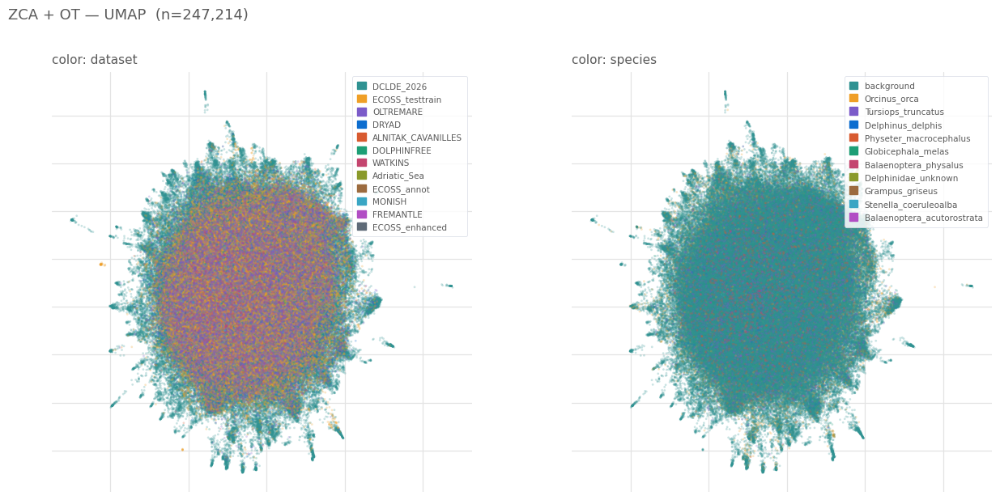

saved → batch_correction_vis/batch_correction_zca_+_ot_tsne.png


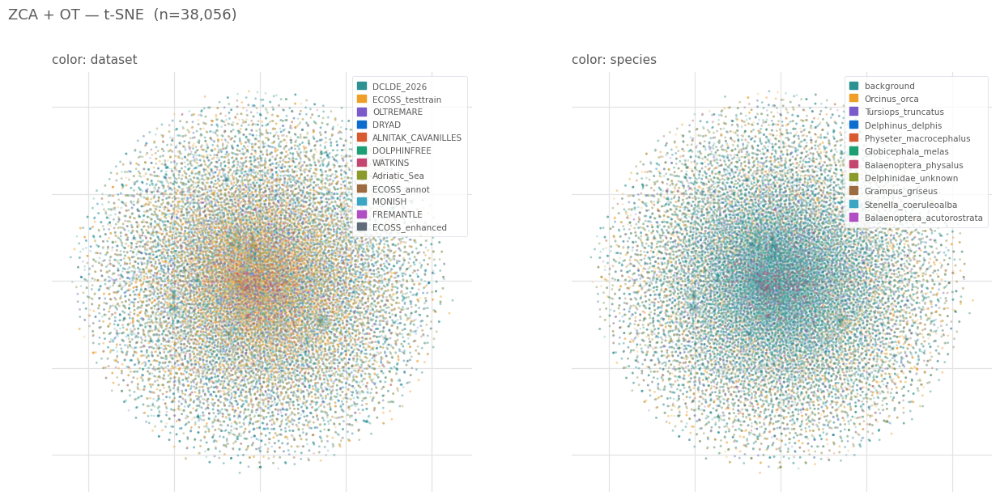

saved → batch_correction_vis/batch_correction_harmony_pca.png


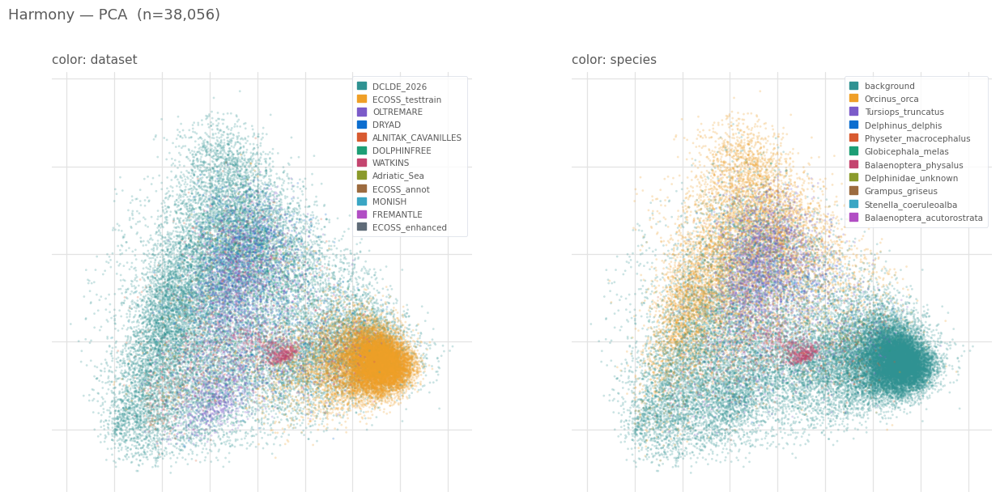

saved → batch_correction_vis/batch_correction_harmony_umap.png


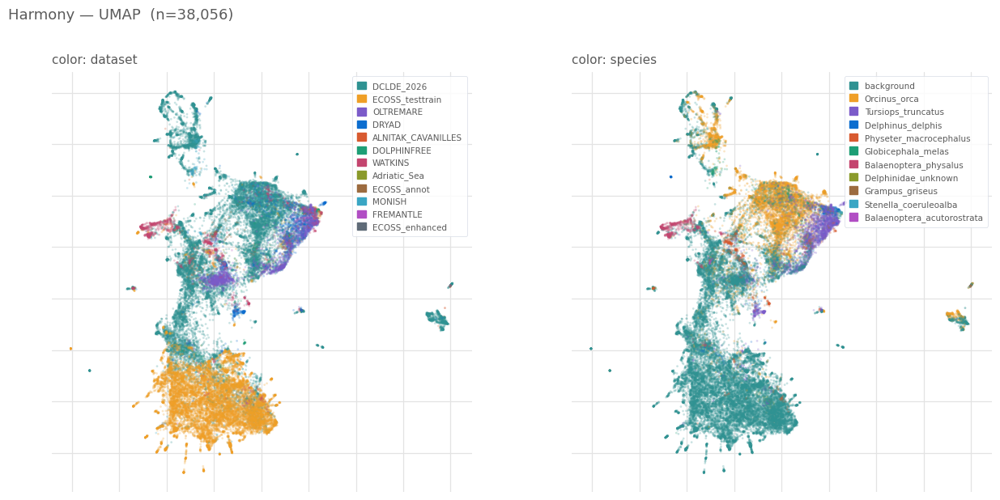

saved → batch_correction_vis/batch_correction_harmony_tsne.png


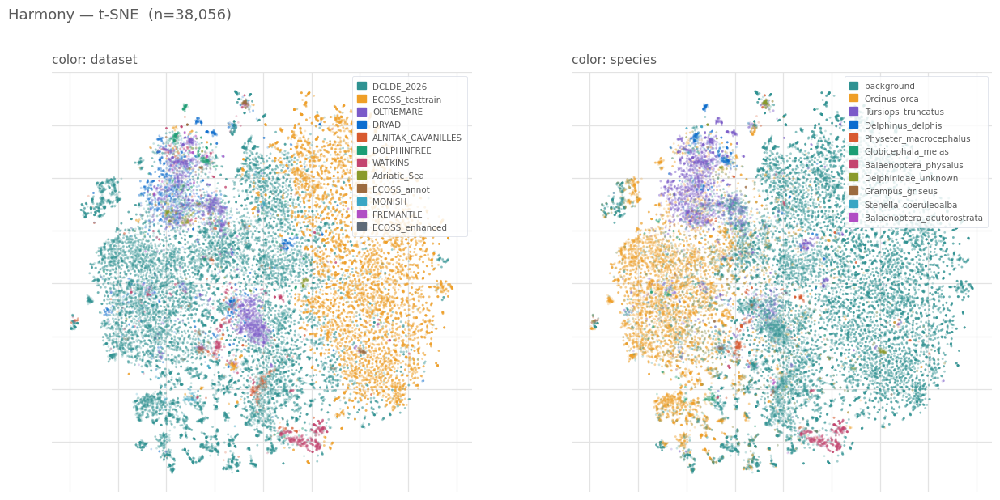

In [16]:
# === CET-DET theme (set once, e.g. top of notebook) ===
import matplotlib.pyplot as plt

GREY  = "#5a5a5a"
PANEL = "white"       # ← whitened panel (was "#e5ecf6")
GRIDC = "#e3e3e3"     # ← grey gridlines so they read on white (was "white")

plt.rcParams.update({
    "text.color": GREY, "axes.labelcolor": GREY, "axes.titlecolor": GREY,
    "xtick.color": GREY, "ytick.color": GREY,
})

# === CET-DET palette (original, saturated) ===
PALETTE = ["#2f9292", "#EF9F27", "#7b5bc9", "#0c6dcf", "#D85A30",   # thesis 5
           "#1d9e75", "#c4456f", "#8a9a2b", "#9c6b3f", "#3aa6c4",   # 12-class extension
           "#b14ec4", "#5f6b78"]
NEUTRAL = "#9aa0a6"   # baseline / background classes

PALETTE_NAMES = ["Teal", "Amber", "Violet", "Deep blue", "Coral",
                 "Emerald", "Magenta", "Olive", "Brown", "Cyan",
                 "Purple", "Slate"]


plt.rcParams["font.family"] = "DejaVu Sans"

def build_color_map(categories, palette=PALETTE, neutral=NEUTRAL):
    """Frequency-ranked category→colour map: most frequent class gets palette[0],
    next most frequent palette[1], etc. Fixed once so it's stable across all figures.
    Ties broken alphabetically for reproducibility."""
    s = pd.Series(categories).astype(str)
    # sort by count desc, then name asc (stable tie-break)
    ranked = (s.value_counts()
                .rename_axis("cat").reset_index(name="n")
                .sort_values(["n", "cat"], ascending=[False, True])["cat"]
                .tolist())
    if len(ranked) > len(palette):
        raise ValueError(f"{len(ranked)} categories > {len(palette)} palette colours")
    return {c: palette[i] for i, c in enumerate(ranked)}

ds_colors  = build_color_map(meta['dataset'])
cls_colors = build_color_map(meta['label_joint'])


# === plotting loop ===
for name, proj in projections.items():
    safe = name.replace(' ', '_').replace('(', '').replace(')', '').lower()

    for proj_type, emb in proj.items():
        n_emb = len(emb)

        if n_emb == len(meta):
            meta_plot = meta
        elif n_emb == len(meta_sub):
            meta_plot = meta_sub
        else:
            print(f"SKIP {name} {proj_type}: emb has {n_emb} rows, "
                  f"meta={len(meta)} meta_sub={len(meta_sub)}")
            continue

        save = OUT_DIR / f'batch_correction_{safe}_{proj_type.lower().replace("-","")}.png'

        fig, axes = plt.subplots(1, 2, figsize=(13, 6.2))
        fig.patch.set_facecolor("white")
        fig.suptitle(f'{name} — {proj_type}  (n={n_emb:,})', x=0.012, ha="left",
                     fontsize=13, color=GREY, y=0.99)

        for ax, (color_dict, key, sub) in zip(axes, [
            (ds_colors,  'dataset',     'color: dataset'),
            (cls_colors, 'label_joint', 'color: species'),
        ]):
            colors = [color_dict[v] for v in meta_plot[key].values]
            ax.scatter(emb[:, 0], emb[:, 1], c=colors,
                       s=4, alpha=0.25, linewidths=0)            # dense? s=4, alpha=0.45

            ax.set_facecolor(PANEL)
            ax.set_box_aspect(1)                                # square panel
            ax.set_title(sub, loc="left", fontsize=11, color=GREY, pad=8)
            ax.tick_params(length=0, labelbottom=False, labelleft=False)
            ax.grid(True, color=GRIDC, linewidth=0.9)
            ax.set_axisbelow(True)
            for s in ax.spines.values():
                s.set_visible(False)

            leg = ax.legend(
                handles=[mpatches.Patch(color=v, label=k)
                         for k, v in color_dict.items()],
                loc="upper right", fontsize=7.5, framealpha=0.85,
                edgecolor="#d8dde6", labelcolor=GREY, borderpad=0.6,
                handlelength=1.0, handleheight=1.0,
            )
            leg.get_frame().set_linewidth(0.6)

        fig.tight_layout(rect=[0, 0, 1, 0.96])
        fig.savefig(save, dpi=300, bbox_inches="tight", facecolor="white")
        print(f"saved → {save}")
        plt.show()

## 10. Side-by-side t-SNE — all four variants

The most useful single figure for the paper / report: all four corrections next
to each other, coloured by dataset (top) and class (bottom).


excluded: ZCA + OT
→ plotting variants: ['Raw (baseline)', 'Std normalisation', 'ZCA whitening', 'Harmony']
saved → batch_correction_vis/tsne_comparison_dataset.png


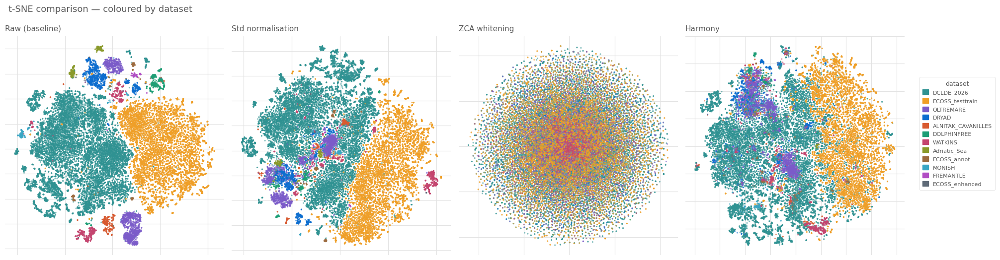

saved → batch_correction_vis/tsne_comparison_label_joint.png


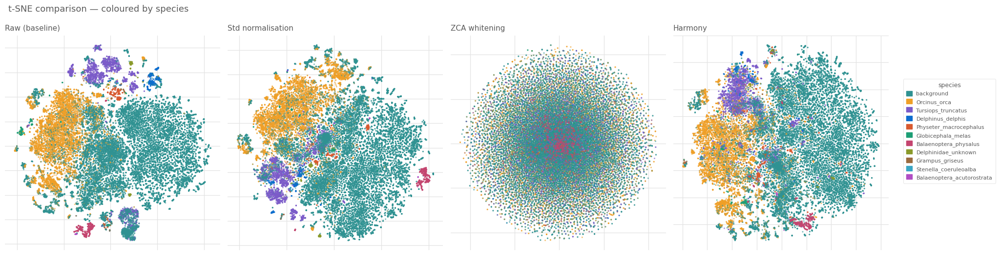

In [17]:
GREY  = "#5a5a5a"
PANEL = "white"       # ← whitened panel (was "#e5ecf6")
GRIDC = "#e3e3e3"     # ← grey gridlines so they read on white (was "white")


EXCLUDE = {"zca + ot", "zca+ot"}
def _norm(s): return s.lower().replace("-", " ").replace("_", " ").strip()

# choose the meta that matches the embeddings (prefer full corpus)
def pick_meta(emb):
    if len(emb) == len(meta):     return meta
    if len(emb) == len(meta_sub): return meta_sub
    return None

# resolve usable variants ONCE, up front
usable = []
for v in projections.keys():
    if _norm(v) in EXCLUDE:
        print(f"excluded: {v}"); continue
    emb = projections[v].get('t-SNE')
    if emb is None:
        print(f"no t-SNE for {v} (keys: {list(projections[v])})"); continue
    if pick_meta(emb) is None:
        print(f"{v}: emb has {len(emb)} rows, no matching meta "
              f"(meta={len(meta)}, meta_sub={len(meta_sub)})"); continue
    usable.append(v)

print("→ plotting variants:", usable)
if not usable:
    raise SystemExit("No usable variants — see messages above.")

n = len(usable)
for color_dict, color_key, color_label in [
    (ds_colors,  'dataset',     'dataset'),
    (cls_colors, 'label_joint', 'species'),
]:
    fig, axes = plt.subplots(1, n, figsize=(4.6*n, 5.2), squeeze=False)
    axes = axes[0]
    fig.patch.set_facecolor("white")
    for ax, vname in zip(axes, usable):
        emb = projections[vname]['t-SNE']
        mp  = pick_meta(emb)
        ax.scatter(emb[:, 0], emb[:, 1],
                   c=[color_dict[v] for v in mp[color_key].values],
                   s=5, alpha=0.6, linewidths=0)
        ax.set_facecolor(PANEL); ax.set_box_aspect(1)
        ax.set_title(vname, loc="left", fontsize=11, color=GREY, pad=8)
        ax.tick_params(length=0, labelbottom=False, labelleft=False)
        ax.grid(True, color=GRIDC, linewidth=0.9); ax.set_axisbelow(True)
        for s in ax.spines.values(): s.set_visible(False)

    leg = fig.legend(
        handles=[mpatches.Patch(color=v, label=k) for k, v in color_dict.items()],
        title=color_label, loc="center left", bbox_to_anchor=(1.005, 0.5),
        fontsize=8, title_fontsize=9, framealpha=0.9, edgecolor="#dddddd",
        labelcolor=GREY, borderpad=0.6, handlelength=1.0, handleheight=1.0)
    leg.get_frame().set_linewidth(0.6)
    fig.suptitle(f't-SNE comparison — coloured by {color_label}',
                 x=0.012, ha="left", fontsize=13, color=GREY, y=1.0)
    fname = OUT_DIR / f'tsne_comparison_{color_key}.png'
    fig.tight_layout(rect=[0, 0, 1, 0.97])
    fig.savefig(fname, dpi=300, bbox_inches="tight", facecolor="white")
    print(f"saved → {fname}")
    plt.show()

## 11. Quantitative batch-effect score

Silhouette score on the 2D t-SNE embeddings, computed separately for dataset
labels and class labels. 

- **Dataset silhouette** — how tightly samples cluster *by dataset*. Lower is better
  after correction (dataset signal removed).
- **Class silhouette** — how tightly samples cluster *by class*. Higher is better
  (class signal preserved).

The ideal correction moves the dataset score down without moving the class score
down (or ideally up).


In [32]:
# Silhouette on t-SNE embeddings (subsample, consistent across all variants)
rows = []
for vname, proj in projections.items():
    emb = proj['t-SNE']
    try:
        ds_sil = silhouette_score(emb, meta_sub['dataset'].values,
                                  sample_size=min(5000, len(emb)), random_state=42)
    except Exception as e:
        ds_sil = float('nan'); print(f"  [{vname}] dataset sil error: {e}")
    try:
        cls_sil = silhouette_score(emb, meta_sub['label_joint'].values,
                                   sample_size=min(5000, len(emb)), random_state=42)
    except Exception as e:
        cls_sil = float('nan'); print(f"  [{vname}] class sil error: {e}")

    rows.append({'variant': vname,
                 'dataset_silhouette (↓ better)': round(ds_sil, 4),
                 'class_silhouette   (↑ better)': round(cls_sil, 4)})

sil_df = pd.DataFrame(rows)
print(sil_df.to_string(index=False))
sil_df.to_csv(OUT_DIR / 'silhouette_scores.csv', index=False)


          variant  dataset_silhouette (↓ better)  class_silhouette   (↑ better)
   Raw (baseline)                        -0.0108                        -0.0893
Std normalisation                        -0.0727                        -0.2173
    ZCA whitening                        -0.3338                        -0.2745
         ZCA + OT                        -0.2956                        -0.2828
          Harmony                        -0.1015                        -0.1825


## 12. Persist correction statistics

Save the per-dataset μ/σ and ZCA matrices so they can be loaded at inference time without re-fitting.

In [33]:
import pickle
 
# ── save corrected PCA-50 full-corpus matrices ────────────────────────────────
np.save(OUT_DIR / 'X_raw_pca50_full.npy',   X_pca50)
np.save(OUT_DIR / 'X_std_pca50_full.npy',   X_std_pca50_full)
np.save(OUT_DIR / 'X_zca_pca50_full.npy',   X_zca_pca50_full)
np.save(OUT_DIR / 'X_zcaot_pca50_full.npy', X_zcaot_pca50_full)
print("saved full-corpus PCA-50 matrices (raw, std, zca, zca+ot)")
 
# ── save subsample indices so you can reconstruct meta_sub ───────────────────
np.save(OUT_DIR / 'sub_idx.npy', sub_idx)
print("saved sub_idx")
 
# ── save all projection coordinates ──────────────────────────────────────────
proj_out = {}
for name, proj in projections.items():
    safe = name.replace(' ', '_').replace('(','').replace(')','').lower()
    for proj_type, emb in proj.items():
        key = f"{safe}_{proj_type.lower().replace('-','')}"
        proj_out[key] = emb
 
with open(OUT_DIR / 'projections.pkl', 'wb') as f:
    pickle.dump(proj_out, f)
print(f"saved {len(proj_out)} projection arrays to projections.pkl")
 
# ── save Harmony subsample coords ────────────────────────────────────────────
np.save(OUT_DIR / 'X_harmony_sub.npy', X_harmony_sub)
print("saved X_harmony_sub")
 

saved full-corpus PCA-50 matrices (raw, std, zca, zca+ot)
saved sub_idx
saved 15 projection arrays to projections.pkl
saved X_harmony_sub


In [34]:
with open(OUT_DIR / 'std_stats.pkl', 'wb') as f:
    pickle.dump(std_stats, f)
print("saved std_stats.pkl")
 
with open(OUT_DIR / 'zca_stats.pkl', 'wb') as f:
    pickle.dump(zca_stats, f)
print("saved zca_stats.pkl")
 
with open(OUT_DIR / 'ot_stats.pkl', 'wb') as f:
    pickle.dump(ot_stats, f)
print("saved ot_stats.pkl")
 
# Harmony has no stored transform — nothing to save.
print("done.")

saved std_stats.pkl
saved zca_stats.pkl
saved ot_stats.pkl
done.


In [ ]:
# ── Cell: MLP comparison across Raw / Std / ZCA / Harmony ────────────────────
# Each variant trained on whatever rows it has, with labels from meta_all.
# Note: assumes meta_all and X_*_full share the same leading row order;
# the 416-row gap is treated as trailing-only.
import numpy as np
import pandas as pd
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score, accuracy_score
from sklearn.preprocessing import LabelEncoder

# ── Paths ────────────────────────────────────────────────────────────────────
IN_DIR  = Path('/data2/mromaniuc/cet-det/alltogether/full_corpus_together/mlp_runs')
PROJ_IN = Path('/data2/mromaniuc/cet-det/alltogether/full_exploration/dim_red/projector_input')
OUT_DIR = Path('./batch_correction_vis')

META_PATH = IN_DIR / 'meta_all_with_taxonomy.parquet'
RANDOM_SEED = 42

# ── 1. Load saved matrices ───────────────────────────────────────────────────
X_raw_full = np.load(OUT_DIR / 'X_raw_pca50_full.npy')
X_std_full = np.load(OUT_DIR / 'X_std_pca50_full.npy')
X_zca_full = np.load(OUT_DIR / 'X_zca_pca50_full.npy')
X_harm_sub = np.load(OUT_DIR / 'X_harmony_sub.npy')
sub_idx    = np.load(OUT_DIR / 'sub_idx.npy')

print(f"X_raw_full : {X_raw_full.shape}")
print(f"X_std_full : {X_std_full.shape}")
print(f"X_zca_full : {X_zca_full.shape}")
print(f"X_harm_sub : {X_harm_sub.shape}")
print(f"sub_idx    : {sub_idx.shape}")

# ── 2. Labels from meta_all, truncated to embedding length ───────────────────
meta_all = pd.read_parquet(META_PATH)
print(f"\nmeta_all rows         : {len(meta_all):,}")
print(f"X_raw_full rows       : {len(X_raw_full):,}")
print(f"truncating meta_all to first {len(X_raw_full):,} rows "
      f"(dropping last {len(meta_all) - len(X_raw_full)})")
meta = meta_all.iloc[:len(X_raw_full)].reset_index(drop=True)

def build_joint_label(row):
    t4 = row['label_t4']
    if pd.notna(t4):
        return t4
    t1, t2 = row['label_t1'], row['label_t2']
    if pd.notna(t1) and t1 == 'non_mammal':
        return 'background'
    if pd.notna(t2) and t2 in ('background', 'anthropogenic'):
        return 'background'
    return None

labels_full = meta.apply(build_joint_label, axis=1).values
labelled_mask_full = pd.notna(labels_full)
print(f"\nlabelled rows in full corpus : {labelled_mask_full.sum():,} / {len(meta):,}")

# Subsample labels: built from full-corpus labels using sub_idx
labels_sub = labels_full[sub_idx]
labelled_mask_sub = pd.notna(labels_sub)
print(f"labelled rows in subsample   : {labelled_mask_sub.sum():,} / {len(sub_idx):,}")

# ── 3. Per-variant: take all labelled rows that variant has ──────────────────
# Raw / Std / ZCA are full-corpus → use labelled_mask_full
# Harmony is subsample-only       → use labelled_mask_sub
variants = {
    'Raw':     (X_raw_full[labelled_mask_full], labels_full[labelled_mask_full].astype(str)),
    'Std':     (X_std_full[labelled_mask_full], labels_full[labelled_mask_full].astype(str)),
    'ZCA':     (X_zca_full[labelled_mask_full], labels_full[labelled_mask_full].astype(str)),
    'Harmony': (X_harm_sub[labelled_mask_sub], labels_sub[labelled_mask_sub].astype(str)),
}

# ── 4. Train an MLP on each variant ──────────────────────────────────────────
results = {}
for name, (X, y) in variants.items():
    print(f"\n{'─'*60}\n  {name}  (X={X.shape}, y={y.shape})\n{'─'*60}")

    # drop singleton classes (stratify requirement)
    counts = pd.Series(y).value_counts()
    ok_classes = counts[counts >= 2].index
    mask_ok = np.isin(y, ok_classes)
    if (~mask_ok).any():
        print(f"  dropping {(~mask_ok).sum()} samples in singleton classes")
    X = X[mask_ok]
    y = y[mask_ok]

    le = LabelEncoder()
    y_enc = le.fit_transform(y)   # int64, same order

    idx_tr, idx_te = train_test_split(
        np.arange(len(y_enc)),
        test_size=0.2,
        stratify=y_enc,
        random_state=RANDOM_SEED,
    )
    X_tr, X_te = X[idx_tr], X[idx_te]
    y_tr, y_te = y_enc[idx_tr], y_enc[idx_te]

    clf = Pipeline([
        ('scaler', StandardScaler()),
        ('mlp', MLPClassifier(
            hidden_layer_sizes=(128, 64),
            activation='relu',
            solver='adam',
            alpha=1e-4,
            batch_size=256,
            learning_rate_init=1e-3,
            max_iter=200,
            early_stopping=True,
            validation_fraction=0.1,
            n_iter_no_change=10,
            random_state=RANDOM_SEED,
        )),
    ])
    clf.fit(X_tr, y_tr)
    y_pred = clf.predict(X_te)

    acc    = accuracy_score(y_te, y_pred)
    f1_mac = f1_score(y_te, y_pred, average='macro')
    f1_wgt = f1_score(y_te, y_pred, average='weighted')
    results[name] = {
        'n_samples':   len(y),
        'n_classes':   len(np.unique(y)),
        'accuracy':    acc,
        'f1_macro':    f1_mac,
        'f1_weighted': f1_wgt,
    }

    print(f"  n_samples    : {len(y):,}")
    print(f"  n_classes    : {len(np.unique(y))}")
    print(f"  accuracy     : {acc:.4f}")
    print(f"  f1 (macro)   : {f1_mac:.4f}")
    print(f"  f1 (weighted): {f1_wgt:.4f}")

# ── 5. Summary table ─────────────────────────────────────────────────────────
print(f"\n{'='*72}\n  Summary\n{'='*72}")
header = f"  {'variant':<10} {'n_samples':>10} {'n_classes':>10} {'accuracy':>10} {'f1_macro':>10} {'f1_weighted':>12}"
print(header)
print("  " + "─" * (len(header) - 2))
for name, r in results.items():
    print(f"  {name:<10} {r['n_samples']:>10,} {r['n_classes']:>10} "
          f"{r['accuracy']:>10.4f} {r['f1_macro']:>10.4f} {r['f1_weighted']:>12.4f}")

X_raw_full : (247214, 50)
X_std_full : (247214, 50)
X_zca_full : (247214, 50)
X_harm_sub : (38056, 50)
sub_idx    : (38056,)

meta_all rows         : 247,630
X_raw_full rows       : 247,214
truncating meta_all to first 247,214 rows (dropping last 416)



labelled rows in full corpus : 246,798 / 247,214
labelled rows in subsample   : 38,024 / 38,056

────────────────────────────────────────────────────────────
  Raw  (X=(246798, 50), y=(246798,))
────────────────────────────────────────────────────────────
  n_samples    : 246,798
  n_classes    : 11
  accuracy     : 0.8807
  f1 (macro)   : 0.5021
  f1 (weighted): 0.8536

────────────────────────────────────────────────────────────
  Std  (X=(246798, 50), y=(246798,))
────────────────────────────────────────────────────────────
  n_samples    : 246,798
  n_classes    : 11
  accuracy     : 0.8782
  f1 (macro)   : 0.4964
  f1 (weighted): 0.8511

────────────────────────────────────────────────────────────
  ZCA  (X=(246798, 50), y=(246798,))
────────────────────────────────────────────────────────────
  n_samples    : 246,798
  n_classes    : 11
  accuracy     : 0.8655
  f1 (macro)   : 0.0844
  f1 (weighted): 0.8031

────────────────────────────────────────────────────────────
  Harmony 

: 